# Exploratory data analysis

In [1]:
from pathlib import Path

import pandas as pd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import folium
import missingno as msno

## Load the 2018 data and properly set data types

In [2]:
%%time
data_directory = Path('../data/green_taxi')
data_files_2018 = list(data_directory.glob('*2018*.csv'))


green_taxi_2018 = pd.concat([
        pd.read_csv(path, dtype={})
        for path in data_files_2018])
green_taxi_2018 = (
    green_taxi_2018
    .assign(**{col: pd.to_datetime(green_taxi_2018[col]) for col in ['lpep_dropoff_datetime', 'lpep_pickup_datetime']})
    .reset_index(drop=True)
)
green_taxi_2018.shape

CPU times: user 13.9 s, sys: 1.33 s, total: 15.2 s
Wall time: 15.6 s


(8807303, 19)

## Check for missing values and the statistics of each variable

### Pick a subset for the statistical analysis

In [3]:
sample_data = (
    green_taxi_2018.sample(200000)
    .sort_values('lpep_dropoff_datetime')
    .reset_index(drop=True))

### Missing values
- Some trips not belonging to 2018
- Some rides have negative or 0 fares or number of passengers
- All features are almost complete with the exception of `ehail_fee`

In [4]:
pd.DataFrame({'min': sample_data.min(), 'max': sample_data.max()}).T

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type
min,1,2009-01-01 00:02:38,2009-01-01 00:05:14,N,1,1,1,0,0,-350,-4.5,-0.5,-0.02,0,NaN,-0.3,-350,1,1
max,2,2019-03-28 07:01:40,2019-03-28 07:06:23,Y,6,265,265,9,90.91,465,4.5,0.55,188.01,31.06,NaN,0.3,465.8,5,2


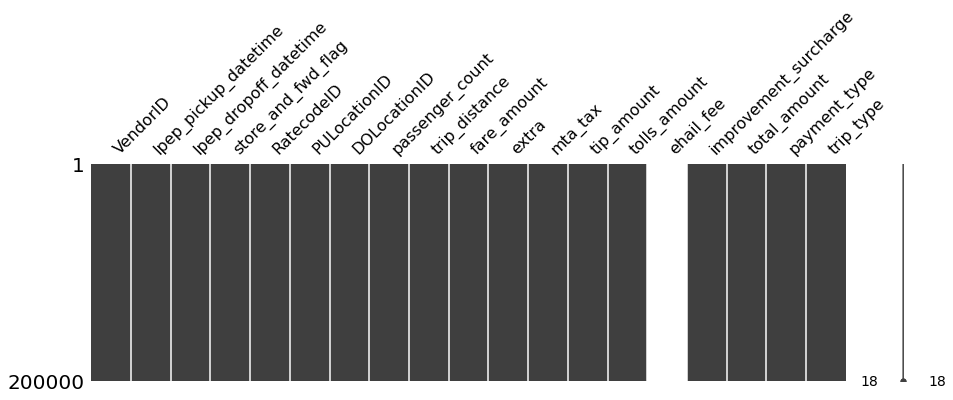

In [5]:
msno.matrix(sample_data, figsize=(15, 4));

In [6]:
def values_in_correct_intervals(df):
    date_correct = df['lpep_pickup_datetime'].dt.year == 2018
    fare_amount_correct = df['fare_amount'] > 2
    passenger_count_correct = df['passenger_count'] > 0
    trip_distance_correct = df['trip_distance'] > 0
    total_amount_correct = df['total_amount'] < 100
    duration_correct = df['lpep_dropoff_datetime'] > df['lpep_pickup_datetime']
    correct_rate = (df['trip_rate'] < 10) & (df['trip_rate'] > 0.5)
    
    return (date_correct & fare_amount_correct & passenger_count_correct & trip_distance_correct & total_amount_correct & duration_correct & correct_rate)
    
    
def clean_dataset(df):
    return (
        df
        .assign(trip_rate=df['fare_amount'] / ((df['lpep_dropoff_datetime'] - df['lpep_pickup_datetime']).dt.total_seconds() / 60.))
        .pipe(lambda df: df[values_in_correct_intervals(df)])
        .drop(columns='ehail_fee'))
    
clean_sample_data = clean_dataset(sample_data)
clean_green_taxi_2018 = clean_dataset(green_taxi_2018)

In [7]:
pd.DataFrame({'min': clean_sample_data.min(), 'max': clean_sample_data.max()}).T

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,payment_type,trip_type,trip_rate
min,1,2018-01-01 00:01:54,2018-01-01 00:12:59,N,1,1,1,1,0.01,2.5,0,0,0,0,0,2.5,1,1,0.500238
max,2,2018-12-31 23:57:30,2019-01-01 00:24:07,Y,5,265,265,9,37.78,99,4.5,0.5,91.03,24.02,0.3,99.8,5,2,10


### Statistics of each feature

#### Location features
- Most rides below 10 miles
- Dropoff locations have larger variance than pickup locations
- A few very popular areas for intra and inter transports

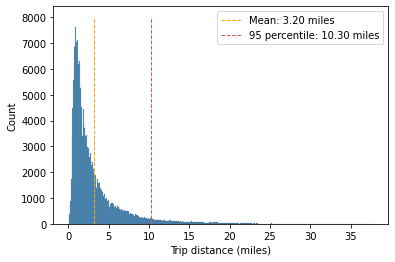

In [8]:
plt.xlabel('Trip distance (miles)')
sns.histplot(clean_sample_data['trip_distance'])

ylim = plt.ylim()
mean = clean_sample_data['trip_distance'].mean()
perc_95 = clean_sample_data['trip_distance'].quantile(0.95)

plt.vlines(mean, *ylim, linestyle='--', linewidth=1, label=f'Mean: {mean:.2f} miles', colors='orange')
plt.vlines(perc_95, *ylim, linestyle='--', linewidth=1, label=f'95 percentile: {perc_95:.2f} miles', colors='indianred')
plt.legend();

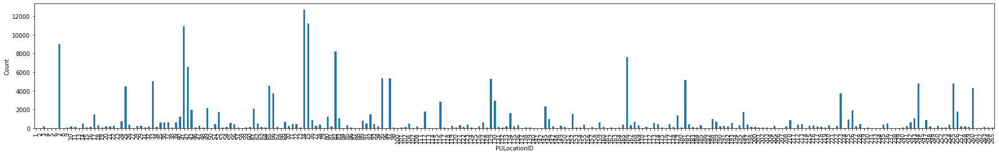

In [9]:
plt.ylabel('Count')
counts_per_pu_location = clean_sample_data.groupby('PULocationID').size().rename('count')
counts_per_pu_location.plot(kind='bar', figsize=(30, 4));

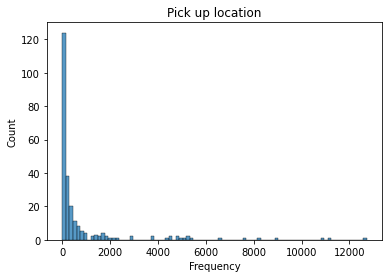

In [10]:
plt.xlabel('Frequency')
plt.title('Pick up location')
sns.histplot(clean_sample_data.groupby('PULocationID').size());

In [11]:
taxi_zones_gdf = gpd.read_file('../data/nyc_taxi_zones.geojson').assign(location_id=lambda df: df['location_id'].astype(int))

In [12]:
pickup_location_gdf = taxi_zones_gdf.merge(counts_per_pu_location.reset_index(), left_on='location_id', right_on='PULocationID')

In [13]:
pickup_location_gdf.sort_values('count', ascending=False).head(10)

,shape_area,objectid,shape_leng,location_id,zone,borough,geometry,PULocationID,count
71,0.000295038418204,74,0.11029093625,74,East Harlem North,Manhattan,"MULTIPOLYGON (((-73.93381 40.81651, -73.93383 ...",74,12725
74,0.00024056392715,75,0.0876638997685,75,East Harlem South,Manhattan,"MULTIPOLYGON (((-73.94103 40.79255, -73.93865 ...",75,11240
38,0.000143093037737,41,0.052793109453,41,Central Harlem,Manhattan,"MULTIPOLYGON (((-73.94774 40.80960, -73.94506 ...",41,10890
6,0.000389787989274,7,0.107417171123,7,Astoria,Queens,"MULTIPOLYGON (((-73.90414 40.76752, -73.90325 ...",7,9014
80,0.000323601079994,82,0.119875649697,82,Elmhurst,Queens,"MULTIPOLYGON (((-73.86769 40.74407, -73.86749 ...",82,8193
153,0.000255276270405,166,0.0688237542871,166,Morningside Heights,Manhattan,"MULTIPOLYGON (((-73.95708 40.81430, -73.95627 ...",166,7595
40,0.000263896952605,42,0.0927092274616,42,Central Harlem North,Manhattan,"MULTIPOLYGON (((-73.93436 40.83620, -73.93445 ...",42,6571
92,0.000163303970435,97,0.0624760147423,97,Fort Greene,Brooklyn,"MULTIPOLYGON (((-73.96934 40.69577, -73.96881 ...",97,5329
90,0.00057277033803,95,0.113629605476,95,Forest Hills,Queens,"MULTIPOLYGON (((-73.84732 40.73877, -73.84721 ...",95,5323
119,0.00047398833179,129,0.0932727273403,129,Jackson Heights,Queens,"MULTIPOLYGON (((-73.87587 40.76605, -73.87554 ...",129,5252


In [14]:
ny_map = folium.Map(
    location=[40.707937 ,-73.970155], 
    tiles='cartodbpositron', 
    zoom_start=11, 
    width=900, 
    height=900)

folium.Choropleth(
    geo_data=pickup_location_gdf.__geo_interface__,
    data=pickup_location_gdf,
    key_on='feature.properties.location_id',
    columns=['location_id', 'count'],
    fill_color='YlGnBu', 
    legend_name='Number of green taxi pick ups (2018)').add_to(ny_map)
ny_map

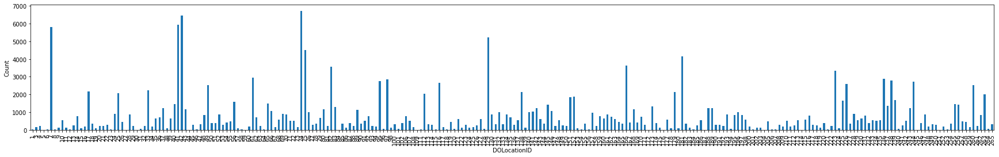

In [15]:
plt.ylabel('Count')
counts_per_do_location = clean_sample_data.groupby('DOLocationID').size().rename('count')
counts_per_do_location.plot(kind='bar', figsize=(30, 4));

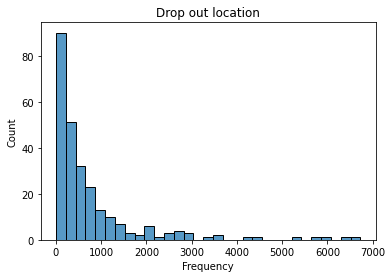

In [16]:
plt.xlabel('Frequency')
plt.title('Drop out location')
sns.histplot(clean_sample_data.groupby('DOLocationID').size());

In [17]:
dropoff_location_gdf = taxi_zones_gdf.merge(counts_per_do_location.reset_index(), left_on='location_id', right_on='DOLocationID')

In [18]:
dropoff_location_gdf.sort_values('count', ascending=False).head(10)

,shape_area,objectid,shape_leng,location_id,zone,borough,geometry,DOLocationID,count
74,0.000295038418204,74,0.11029093625,74,East Harlem North,Manhattan,"MULTIPOLYGON (((-73.93381 40.81651, -73.93383 ...",74,6729
42,0.000263896952605,42,0.0927092274616,42,Central Harlem North,Manhattan,"MULTIPOLYGON (((-73.93436 40.83620, -73.93445 ...",42,6452
39,0.000143093037737,41,0.052793109453,41,Central Harlem,Manhattan,"MULTIPOLYGON (((-73.94774 40.80960, -73.94506 ...",41,5920
5,0.000389787989274,7,0.107417171123,7,Astoria,Queens,"MULTIPOLYGON (((-73.90414 40.76752, -73.90325 ...",7,5801
124,0.00047398833179,129,0.0932727273403,129,Jackson Heights,Queens,"MULTIPOLYGON (((-73.87587 40.76605, -73.87554 ...",129,5217
77,0.00024056392715,75,0.0876638997685,75,East Harlem South,Manhattan,"MULTIPOLYGON (((-73.94103 40.79255, -73.93865 ...",75,4499
174,0.000306890292807,181,0.0895372399547,181,Park Slope,Brooklyn,"MULTIPOLYGON (((-73.97583 40.66582, -73.97633 ...",181,4160
160,0.000255276270405,166,0.0688237542871,166,Morningside Heights,Manhattan,"MULTIPOLYGON (((-73.95708 40.81430, -73.95627 ...",166,3622
83,0.000323601079994,82,0.119875649697,82,Elmhurst,Queens,"MULTIPOLYGON (((-73.86769 40.74407, -73.86749 ...",82,3564
218,0.00076436070058,223,0.166021925275,223,Steinway,Queens,"MULTIPOLYGON (((-73.90649 40.79018, -73.90251 ...",223,3350


In [19]:
ny_map = folium.Map(
    location=[40.707937 ,-73.970155], 
    tiles='cartodbpositron', 
    zoom_start=11, 
    width=900, 
    height=900)

folium.Choropleth(
    geo_data=dropoff_location_gdf.__geo_interface__,
    data=dropoff_location_gdf,
    key_on='feature.properties.location_id',
    columns=['location_id', 'count'],
    fill_color='YlGnBu', 
    legend_name='Number of green taxi drop outs (2018)').add_to(ny_map)
ny_map

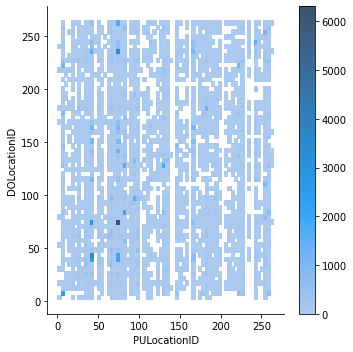

In [20]:
sns.displot(clean_sample_data, x='PULocationID', y='DOLocationID', cbar=True, thresh=5);

### Time features

In [21]:
pickup_time_by_date = clean_green_taxi_2018.groupby(green_taxi_2018['lpep_pickup_datetime'].dt.date).size().sort_index()

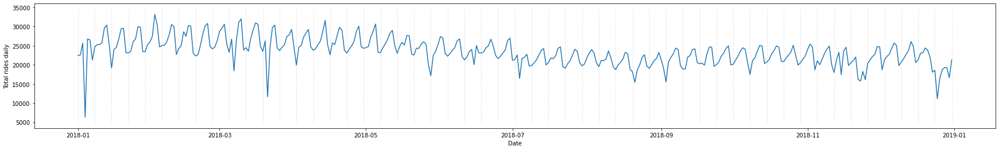

In [22]:
plt.figure(figsize=(30, 4))
plt.xlabel('Date')
plt.ylabel('Total rides daily')
plt.plot(pickup_time_by_date)
ylim = plt.ylim()
plt.vlines(pickup_time_by_date.index[pd.to_datetime(pickup_time_by_date.index).dayofweek == 0], *ylim, linestyle='--', linewidth=1, alpha=0.1);

In [23]:
pickup_time_by_hour_average_week = (
    clean_green_taxi_2018
    .groupby(green_taxi_2018['lpep_pickup_datetime'].dt.round('H'))
    .size()
    .reset_index()
    .pipe(lambda df: df.groupby([df['lpep_pickup_datetime'].dt.dayofweek, df['lpep_pickup_datetime'].dt.hour]))
    .mean())

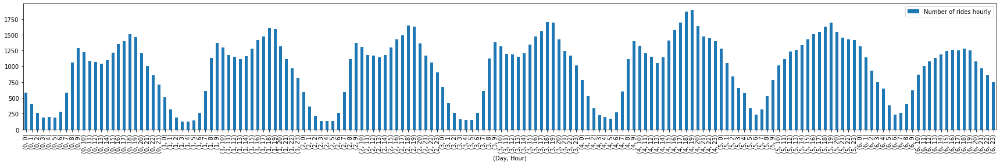

In [24]:
pickup_time_by_hour_average_week.rename(columns={0: 'Number of rides hourly'}).plot(kind='bar', figsize=(30, 4))
plt.xlabel('(Day, Hour)');

### Fare and passenger related features

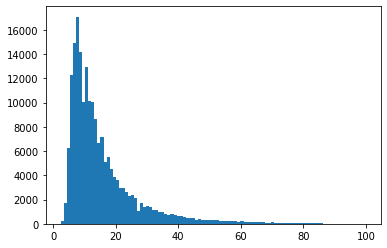

In [25]:
plt.hist(clean_sample_data['total_amount'], bins=100);

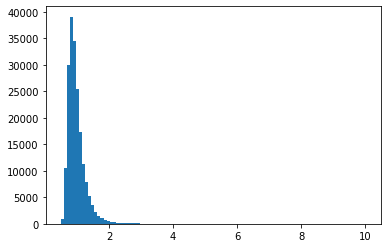

In [26]:
plt.hist(clean_sample_data['trip_rate'], bins=100);

In [27]:
fare_by_hour_average_week = (
    clean_green_taxi_2018
    .groupby(green_taxi_2018['lpep_pickup_datetime'].dt.round('H'))
    .agg(dict(trip_rate='mean'))
    .reset_index()
    .pipe(lambda df: df.groupby([df['lpep_pickup_datetime'].dt.dayofweek, df['lpep_pickup_datetime'].dt.hour]))
    .agg(dict(trip_rate='mean'))
)

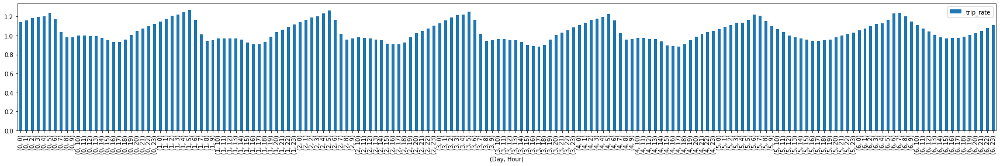

In [28]:
fare_by_hour_average_week.rename(columns={0: 'Number of rides hourly'}).plot(kind='bar', figsize=(30, 4))
plt.xlabel('(Day, Hour)');

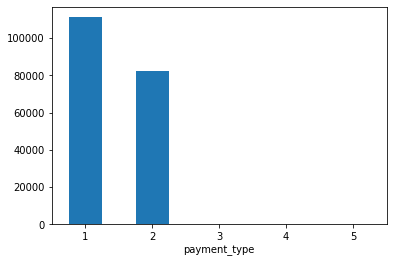

In [29]:
clean_sample_data.groupby('payment_type').size().plot(kind='bar', rot=0);

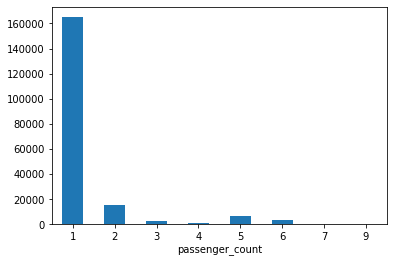

In [30]:
clean_sample_data.groupby('passenger_count').size().plot(kind='bar', rot=0);

## Best and worst routes

In [31]:
fare_per_route = (
    clean_green_taxi_2018
    .groupby(['PULocationID', 'DOLocationID'])
    .agg(dict(total_amount='mean', trip_rate='mean'))
    .reset_index()
    .merge(taxi_zones_gdf, left_on='PULocationID', right_on='location_id')
    .merge(taxi_zones_gdf, left_on='DOLocationID', right_on='location_id', suffixes=['_pickup', '_dropoff'])
    [['total_amount', 'trip_rate', 'zone_pickup', 'zone_dropoff']]
)

In [32]:
fare_per_route.sort_values('total_amount')

,total_amount,trip_rate,zone_pickup,zone_dropoff
5241,3.80,1.855670,TriBeCa/Civic Center,Chinatown
1164,3.80,8.571429,Stuy Town/Peter Cooper Village,Alphabet City
169,4.30,5.250000,Jamaica Bay,Jamaica Bay
6756,4.55,3.160793,Crotona Park,Crotona Park
33917,4.93,2.222920,Meatpacking/West Village West,Meatpacking/West Village West
...,...,...,...,...
40083,99.82,1.013078,Stapleton,Willets Point
32397,99.82,1.142417,East Flushing,Eltingville/Annadale/Prince's Bay
32309,99.82,0.783231,Middle Village,Bloomfield/Emerson Hill
34328,99.96,1.214744,Brooklyn Navy Yard,Newark Airport


In [33]:
fare_per_route.sort_values('trip_rate')

,total_amount,trip_rate,zone_pickup,zone_dropoff
70,35.00,0.514454,Glendale,DUMBO/Vinegar Hill
27487,59.90,0.521669,Hammels/Arverne,UN/Turtle Bay South
19749,38.30,0.528665,JFK Airport,Mount Hope
36441,26.68,0.532114,Auburndale,East Williamsburg
34732,22.22,0.545499,South Williamsburg,Battery Park
...,...,...,...,...
22870,35.91,6.734694,Battery Park City,Red Hook
10445,47.80,7.643836,Two Bridges/Seward Park,Financial District North
20522,49.80,8.044693,Douglaston,Ocean Hill
23959,60.30,8.108108,UN/Turtle Bay South,Seaport
